## <font color='green'> <div align="center">In the name of God </div></font>

### <font color='red'> Author: Sayed Kamaledin Ghiasi-Shrirazi <a href="http://profsite.um.ac.ir/~k.ghiasi">(http://profsite.um.ac.ir/~k.ghiasi)</a> </font>

# Illustrative Experiments on the ORL face recognition dataset with a regularization parameter of $1$

##### Importing general modules.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import sklearn
import scipy.stats as st
import scipy.io as sio
import time
import matplotlib.image as mpimg
import matplotlib as mpl

##### Importing modules wtitten by the author

In [2]:
from LinearDiscriminantAnalysis import LinearDiscriminantAnalysis
from LDATrainingDataPreparation import TrainingData

##### Preparing matplotlib to genrate high-quality images for the paper

In [3]:
%matplotlib inline
mpl.rcParams['figure.dpi']= 600

##### Setup

In [4]:
C  = 40
spc = 10 # sample per class
K = 4
maxVqIteration = 100
width = 92
height = 112
reg =  1

##### Load dataset

In [5]:
path = '../datasets/orl_faces'
X = np.zeros ([C, spc, height, width])
yTrain = np.zeros (C * spc)

for c in range (C):
    for i in range (spc):
        yTrain[c * spc + i] = c
        file = path + '/s' + str(c+1) + '/' + str(i+1) + '.pgm' 
        X[c,i,:,:] = mpimg.imread (file) / 255
        img = np.zeros ([height,width, 3])
        img[:,:,0] = img[:,:,1] = img[:,:,2] = X[c,i]
        #plt.imshow (img)
        #plt.show()
        
XTrain = X.reshape ([C * spc, height * width])
XTest = XTrain
yTest = yTrain

##### Prepare data for LDA.

In [6]:
np.random.seed(1)
td = TrainingData(XTrain, yTrain)

clusAlg = sklearn.cluster.KMeans()
clusAlg.max_iter = maxVqIteration
arrayK = np.ones(C, dtype=int)*K
td.findSubclasses(arrayK, clusAlg)

##### Show Clustering Result

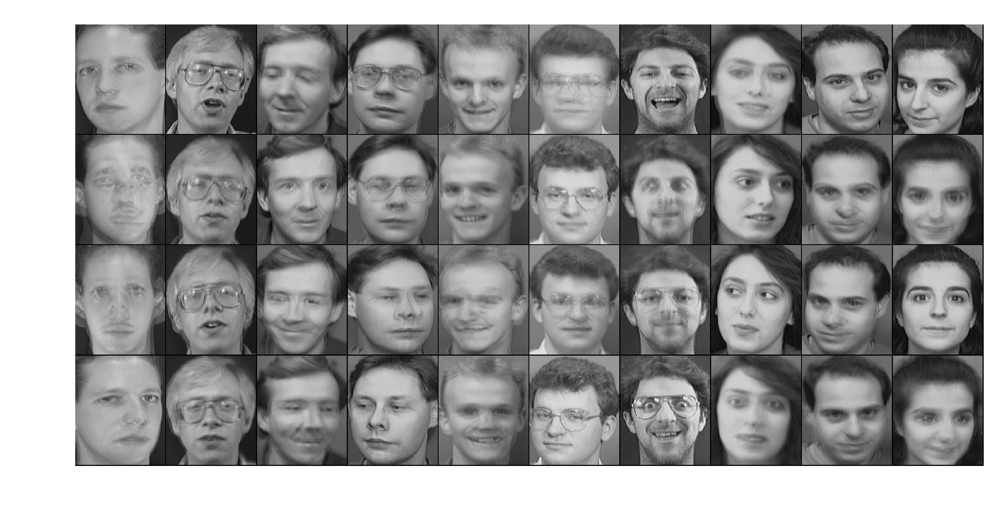

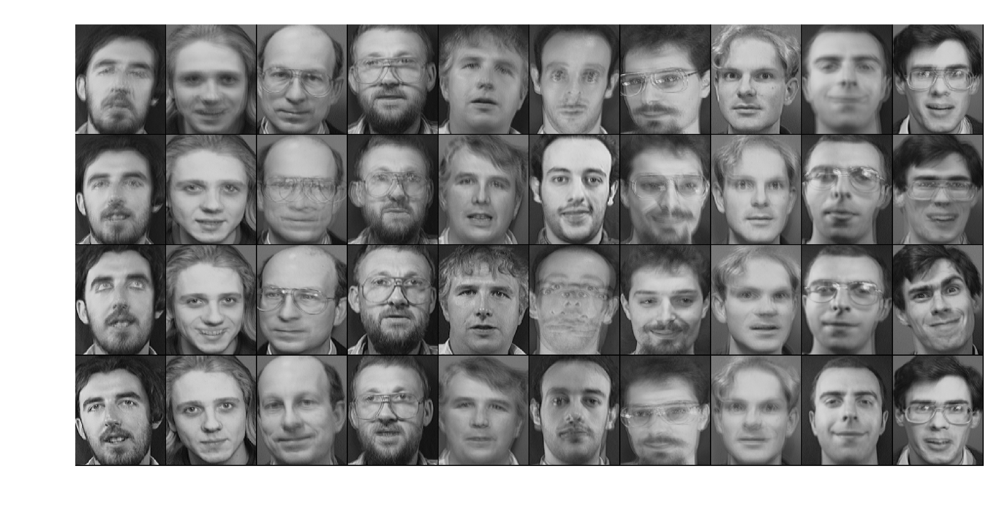

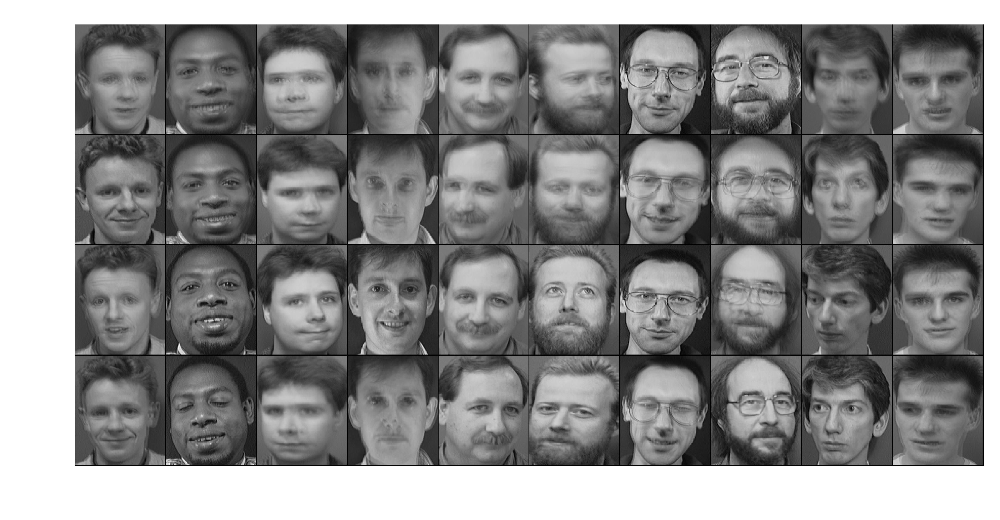

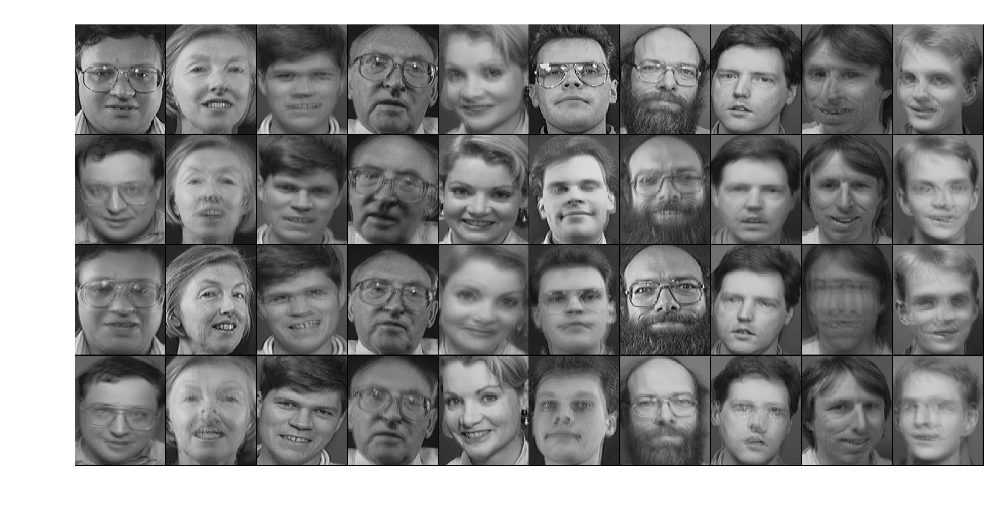

In [7]:
nPicture = 4
img = np.zeros ([K*(height+1), td.C // nPicture * (width+1) , 3])
for picture in range (nPicture):
    for cc in range(td.C//nPicture):
        c = picture * td.C//nPicture + cc
        for k in range (td.Ki[c]):
            idx1 = k*(height+1)
            idx2 = cc*(width+1)
            img[idx1:idx1+height, idx2:idx2+width, 0] = td.subclassMeans[c,k].reshape ([height,width])
            img[idx1:idx1+height, idx2:idx2+width, 1] = img[idx1:idx1+height, idx2:idx2+width, 0]
            img[idx1:idx1+height, idx2:idx2+width, 2] = img[idx1:idx1+height, idx2:idx2+width, 0]
    plt.axis ('off')
    #plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
    plt.tight_layout(pad=0)
    plt.imshow(img)    
    fn = 'orl_clustering_faces' + str((picture+1)) + '.png'
    plt.imsave(fn, img)
    plt.show()

In [8]:
def performExperiment (solver, reg):
    print ('solver = ', solver)
    lda = LinearDiscriminantAnalysis(td, solver, 'Sb', 'St', reg, 0.0001)
    
    start = time.time()
    lda.fitFeatureExtractor()
    end = time.time()
    print ('lda.fitFeatureExtractor took time: ', end - start)
    
    objective = lda.objective()
    print('Objective: ' , objective)

    imgs = lda.GenerateImagesOfLinearFeatureExtractorWeights(width, height, 
                        color = 'gray', nImages = nPicture, rows=K, cols = C // nPicture)
    for i, img in enumerate (imgs):
        plt.imshow (img)
        plt.axis('off')
        fn = 'orl_{}_faces'.format(solver) + str((i+1)) + '.png'
        plt.imsave(fn, img)        
        plt.show()

solver =  svd
lda.fitFeatureExtractor took time:  2.0062224864959717
Objective:  42.58743876700323


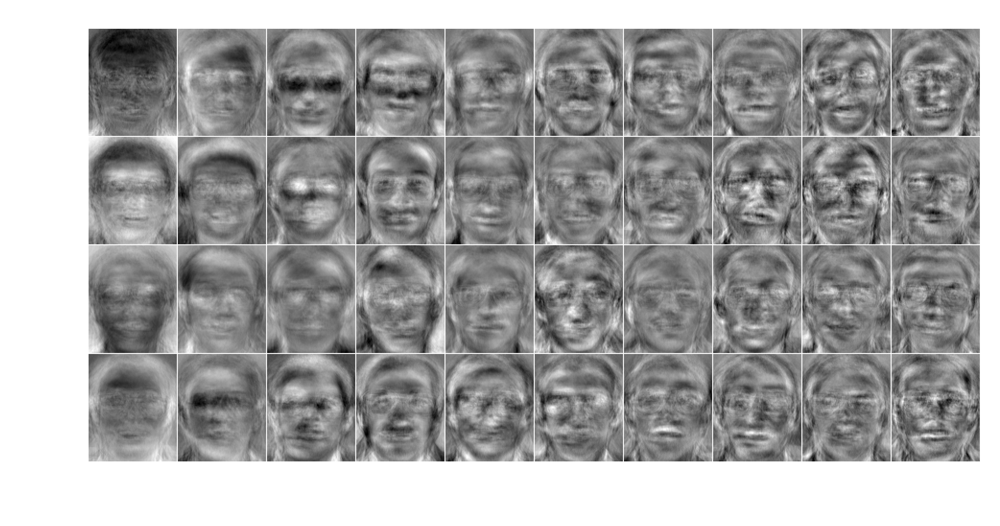

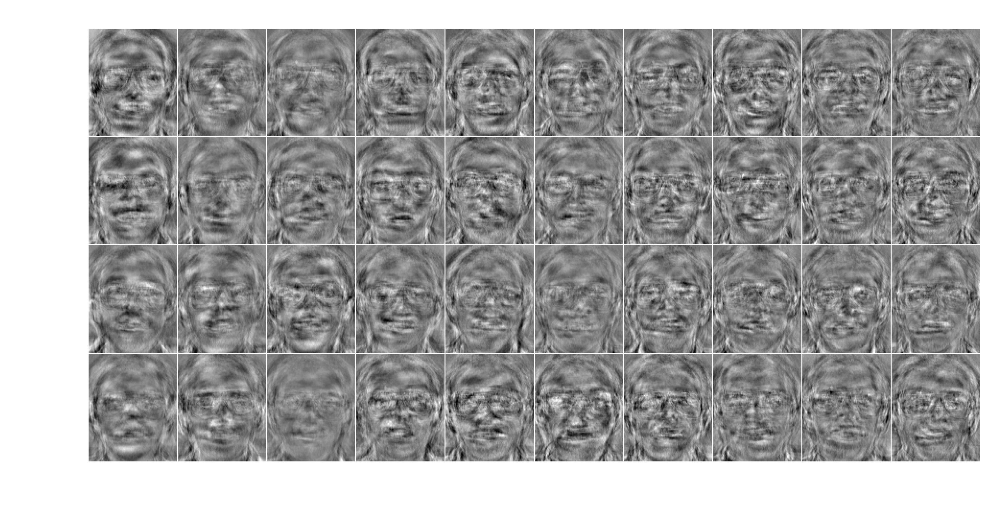

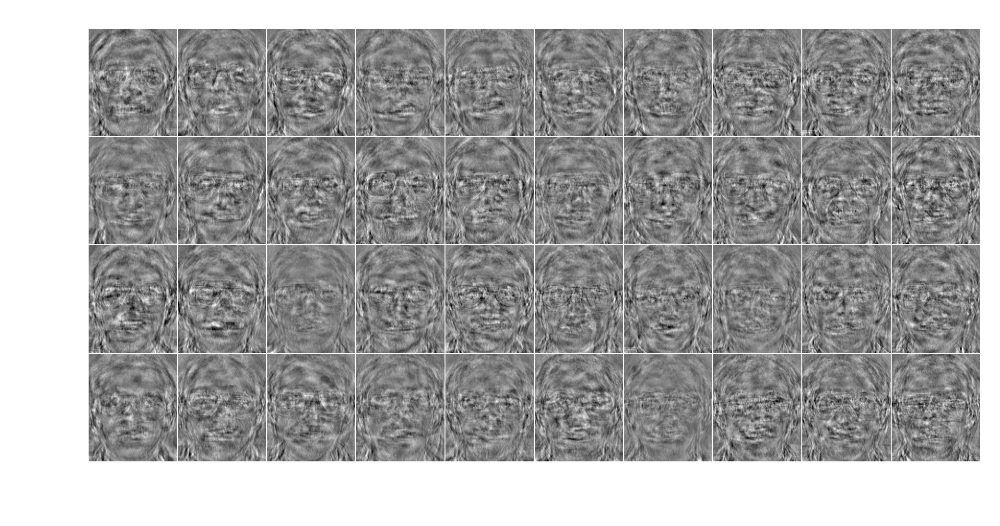

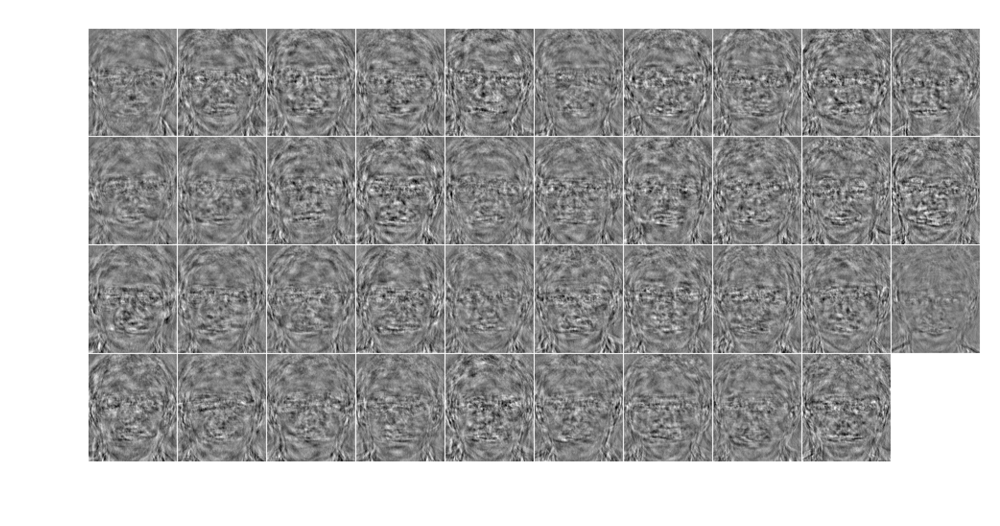

In [9]:
performExperiment ('svd', reg)

solver =  ghiasi_svd
lda.fitFeatureExtractor took time:  1.1035068035125732
Objective:  42.587438767003235


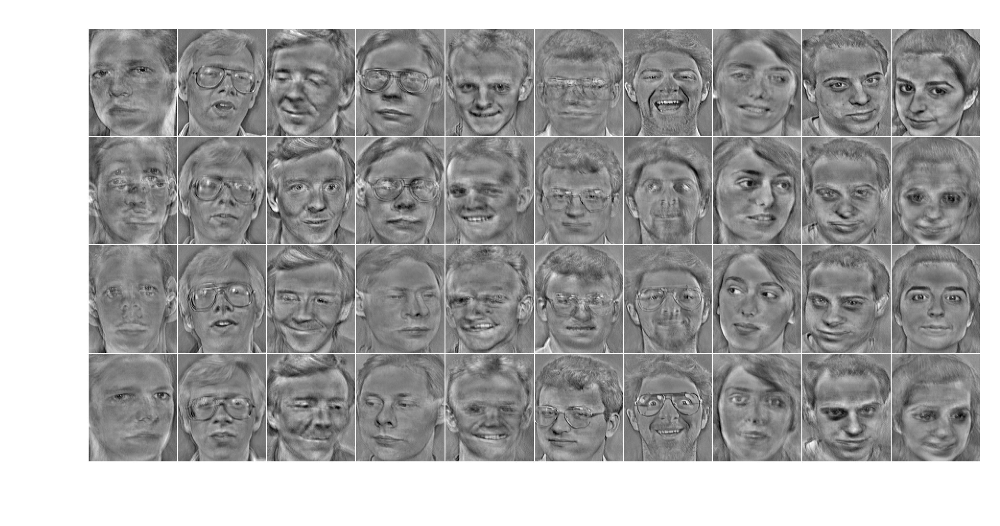

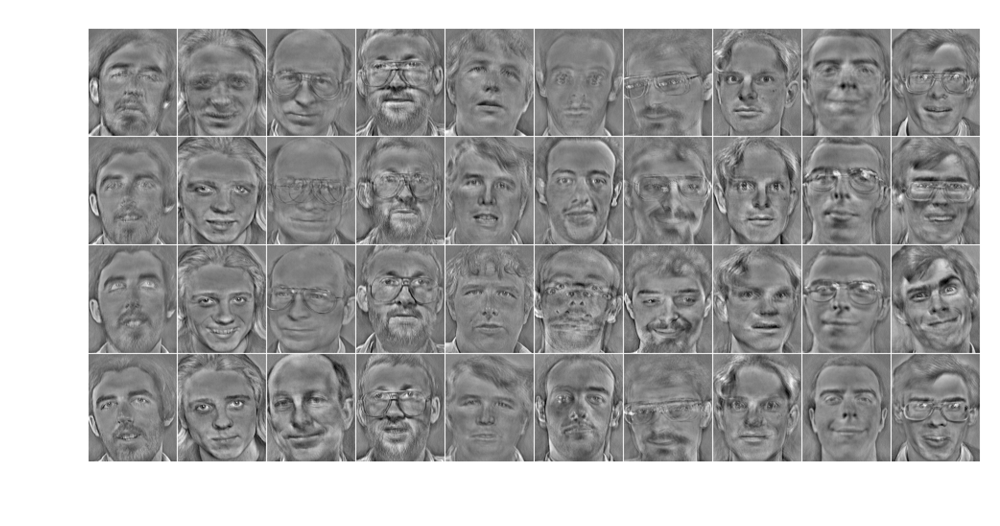

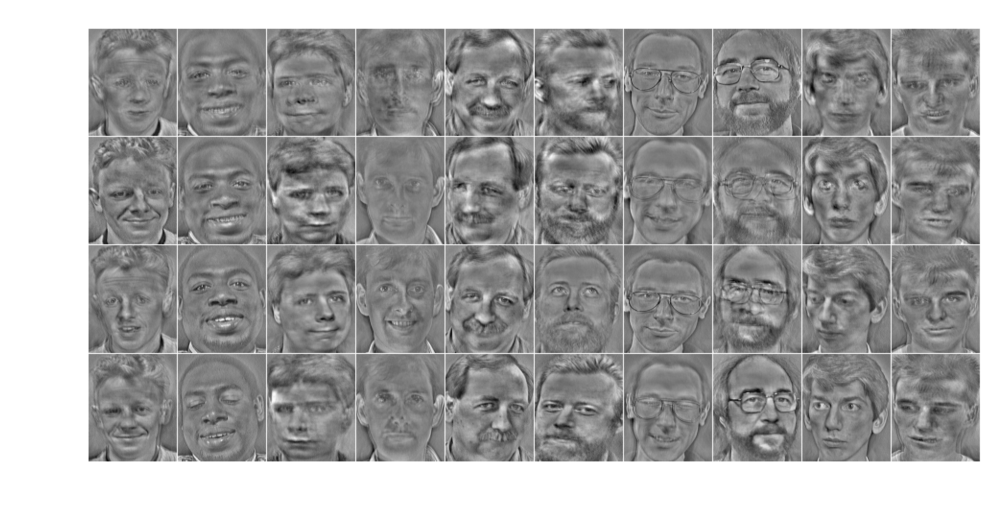

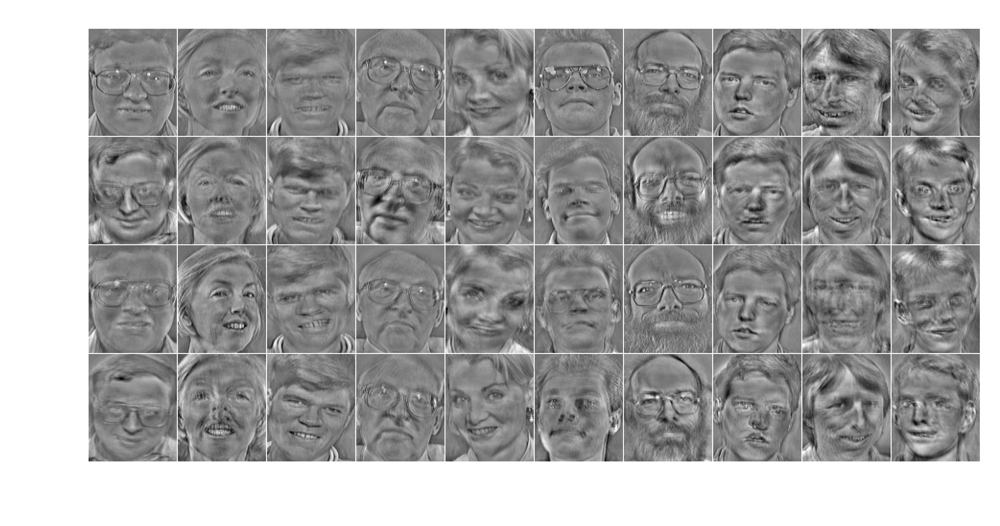

In [10]:
performExperiment ('ghiasi_svd', reg)

### <font color='red'> Author: Sayed Kamaledin Ghiasi-Shrirazi <a href="http://profsite.um.ac.ir/~k.ghiasi">(http://profsite.um.ac.ir/~k.ghiasi)</a> </font>